In [1]:
# Importing Modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('whitegrid')
pd.set_option('display.max_rows', 50000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
from pandas.api.types import CategoricalDtype
#import calendar
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [2]:
# Read in dates as datetime objects and create a dictionary 'd_dtypes' to read in other data types correctly
dates = ['applicationDate','approvalDate','disbursementDate','repaidDate', 'FirstPaymentDueDate', 'dueDate']
d_types = {'loanId':str,
           'clientId': str,
           'clientIncome': float,
           'incomeVerified':object,
          'clientGender':'category',
          'clientMaritalStatus':'category',
          'clientLoanPurpose':'category',
          'clientResidentialStauts':'category',
          'clientState':'category',
            'clientTimeAtEmployer':'category',
          'clientNumberPhoneContacts':float,
           'clientAvgCallsPerDay':float,
           'loanTerm': 'category',
           'settleDays':int,
           'firstPaymentRatio':float}

In [3]:
# Read in the raw dataset gotten from bigquery and pass the necessary arguments
# change the filepath to where your csv file is located
loans = pd.read_csv('cleaned_loans.csv', parse_dates= dates, na_values=['Null','nan'], infer_datetime_format=True, 
                    dtype=d_types, index_col = 0)
loans.head()

C:\Users\ajayi\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (18) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,loanId,clientId,clientIncome,incomeVerified,clientAge,clientGender,clientMaritalStatus,clientLoanPurpose,clientResidentialStauts,clientState,clientTimeAtEmployer,clientNumberPhoneContacts,clientAvgCallsPerDay,loanType,loanNumber,applicationDate,approvalDate,declinedDate,disbursementDate,payout_status,dueDate,paidAt,loanAmount,interestRate,loanTerm,max_amount_taken,max_tenor_taken,repaidDate,FirstPaymentDueDate,settleDays,paymentRatio,firstPaymentDefault,loanDefault
0,PP99804128,676059506,66452.66,true,38,MALE,Married,education,Employer Provided,SOKOTO,36+,458.0,6.792453,paylater,1,2018-05-05,2018-05-05,NaN,2018-05-05,SUCCESS,2018-08-03 01:34:45,2018-06-29 08:53:04,42000,6.0,90,1,1,2018-05-26 01:31:14,2018-06-04 12:00:00,-9,0.0,0,0
1,PP99781446,704436304,35000.00,true,35,MALE,Single,other,Rented,KOGI,36+,708.0,2.144928,paylater,1,2018-05-06,2018-05-06,NaN,2018-05-06,SUCCESS,2018-08-04 04:56:46,2018-07-08 12:36:26,20000,6.0,90,0,1,2018-06-11 10:41:30,2018-06-05 12:00:00,6,0.0,0,0
2,PP99274960,487954787,162851.11,true,47,FEMALE,Married,education,Own Residence,OYO,36+,622.0,36.095238,paylater,1,2018-05-05,2018-05-05,NaN,2018-05-05,SUCCESS,2018-08-03 08:44:19,2018-07-10 10:44:13,134000,6.0,90,0,1,2018-06-27 11:19:31,2018-06-04 12:00:00,23,0.0,1,0
3,PP97847695,349843136,55053.68,true,33,MALE,Single,other,Own Residence,ABUJA,36+,NaN,NaN,paylater,1,2018-05-08,2018-05-08,NaN,2018-05-08,SUCCESS,2018-08-06 10:46:42,2018-09-12 12:55:45,34500,6.0,90,1,1,2018-05-31 04:00:15,2018-06-07 12:00:00,-7,0.0,0,1
4,PP97841916,925196860,32112.55,true,30,MALE,Single,house,Rented,PLATEAU,36+,608.0,85.528481,paylater,1,2018-05-09,2018-05-09,NaN,2018-05-09,SUCCESS,2018-08-07 08:24:23,2018-07-30 05:48:09,20000,6.0,90,1,1,2018-06-27 11:19:16,2018-06-08 12:00:00,19,0.0,1,0


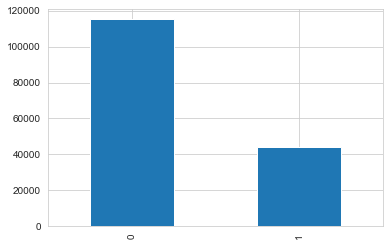

In [5]:
loans['loanDefault'].value_counts().plot(kind = 'bar')

In [4]:
# Convert loanTerm to a categorical data type and make it ordered
cat_type_loan = CategoricalDtype(categories=['60', '90', '180'],ordered=True)
loans['loanTerm'] = loans['loanTerm'].astype(cat_type_loan)

In [5]:
# Inspect loans information
loans.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159596 entries, 0 to 159595
Data columns (total 33 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   loanId                     159596 non-null  object        
 1   clientId                   159596 non-null  object        
 2   clientIncome               159596 non-null  float64       
 3   incomeVerified             159493 non-null  object        
 4   clientAge                  159596 non-null  int64         
 5   clientGender               159596 non-null  category      
 6   clientMaritalStatus        159590 non-null  category      
 7   clientLoanPurpose          159596 non-null  category      
 8   clientResidentialStauts    158460 non-null  category      
 9   clientState                159595 non-null  category      
 10  clientTimeAtEmployer       155402 non-null  category      
 11  clientNumberPhoneContacts  156888 non-null  float64 

In [6]:
loans.nunique().to_frame().transpose()

,loanId,clientId,clientIncome,incomeVerified,clientAge,clientGender,clientMaritalStatus,clientLoanPurpose,clientResidentialStauts,clientState,clientTimeAtEmployer,clientNumberPhoneContacts,clientAvgCallsPerDay,loanType,loanNumber,applicationDate,approvalDate,declinedDate,disbursementDate,payout_status,dueDate,paidAt,loanAmount,interestRate,loanTerm,max_amount_taken,max_tenor_taken,repaidDate,FirstPaymentDueDate,settleDays,paymentRatio,firstPaymentDefault,loanDefault
0,159596,91904,9362,2,44,2,5,5,5,39,40,7377,100306,1,32,316,316,5,305,1,157900,125481,483,133,3,2,2,138120,299,419,4875,2,2


In [7]:
# Sum of missing values in the dataset
loans.isna().sum()

loanId                            0
clientId                          0
clientIncome                      0
incomeVerified                  103
clientAge                         0
clientGender                      0
clientMaritalStatus               6
clientLoanPurpose                 0
clientResidentialStauts        1136
clientState                       1
clientTimeAtEmployer           4194
clientNumberPhoneContacts      2708
clientAvgCallsPerDay           2687
loanType                          0
loanNumber                        0
applicationDate                   0
approvalDate                      0
declinedDate                 159589
disbursementDate                  0
payout_status                     0
dueDate                           0
paidAt                        29800
loanAmount                        0
interestRate                      0
loanTerm                          0
max_amount_taken                  0
max_tenor_taken                   0
repaidDate                  

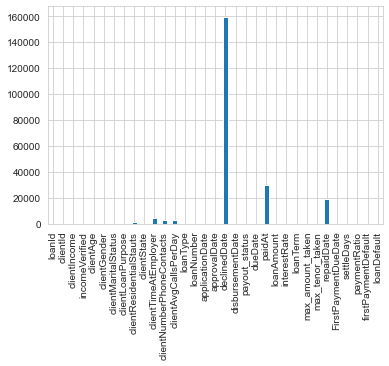

In [8]:
loans.isna().sum().plot(kind = 'bar')

In [9]:
loans.describe()
# An anomaly was noticed for the clientAge column; maximum age is 138. Look into this.

,clientIncome,clientAge,clientNumberPhoneContacts,clientAvgCallsPerDay,loanNumber,loanAmount,interestRate,max_amount_taken,max_tenor_taken,settleDays,paymentRatio,firstPaymentDefault,loanDefault
count,1.595960e+05,159596.000000,156888.000000,156909.000000,159596.000000,159596.000000,159596.000000,159596.000000,159596.000000,159596.000000,159596.000000,159596.000000,159596.000000
mean,9.083906e+04,33.691847,1262.284936,59.137352,3.556806,35324.184190,13.331235,0.705275,0.915374,32.602189,0.097991,0.294268,0.277419
std,9.728033e+04,7.180870,1525.329265,102.064134,2.471578,27840.824297,4.467938,0.455921,0.278325,84.552544,0.278058,0.455714,0.447727
min,3.000000e+01,18.000000,0.000000,0.000000,1.000000,11000.000000,4.500000,0.000000,0.000000,-32.000000,0.000000,0.000000,0.000000
25%,3.500000e+04,28.000000,429.000000,9.885246,2.000000,20000.000000,10.000000,0.000000,1.000000,-2.000000,0.000000,0.000000,0.000000
50%,5.511621e+04,33.000000,825.000000,29.383838,3.000000,25500.000000,12.500000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,1.050000e+05,38.000000,1550.000000,70.046763,4.000000,37500.000000,15.000000,1.000000,1.000000,13.000000,0.000000,1.000000,1.000000
max,3.925000e+06,138.000000,60595.000000,10994.500000,32.000000,500000.000000,20.000000,1.000000,1.000000,386.000000,1.000000,1.000000,1.000000


# Exploratory Data Analysis

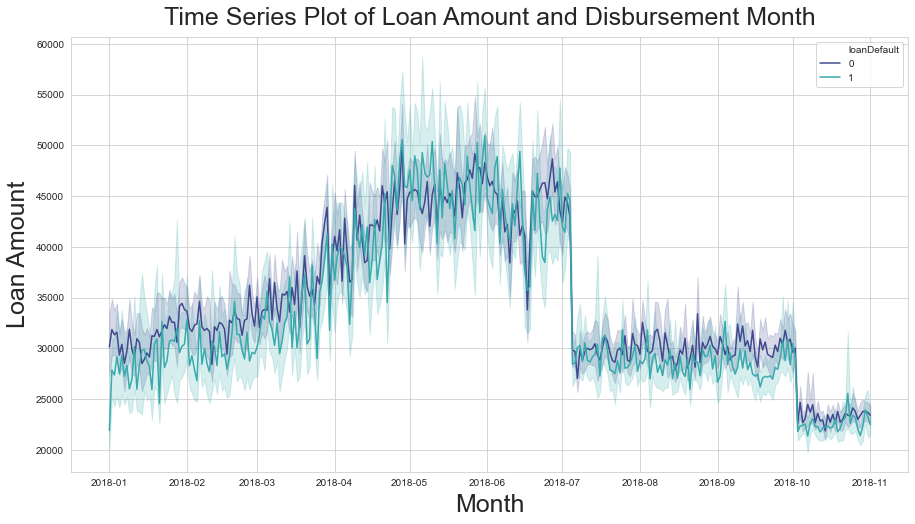

In [10]:
# Plot a timeseries line plot showing the status of loan amounts as a function of the disbursement date's month
plt.figure(figsize=(15,8))

sns.lineplot(x='disbursementDate', y='loanAmount',hue='loanDefault', data=loans, palette='mako')

plt.xlabel('Month', fontsize=25, labelpad=6)
plt.ylabel('Loan Amount', fontsize=25, labelpad=6)
plt.title('Time Series Plot of Loan Amount and Disbursement Month', fontsize=25, pad=12);

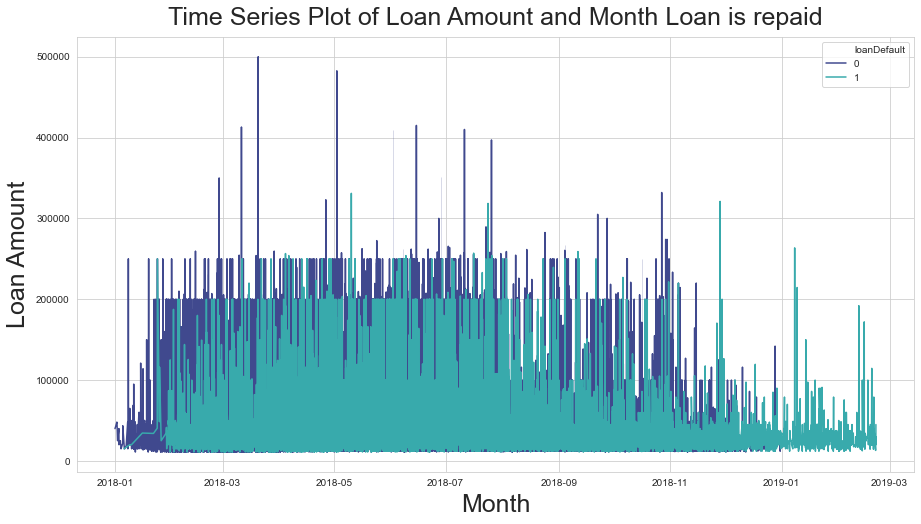

In [11]:
plt.figure(figsize=(15,8))
# Plot a timeseries line plot showing the status of loan amounts as a function of the due date's month
sns.lineplot(x='repaidDate', y='loanAmount',hue='loanDefault', data=loans, palette='mako')

plt.xlabel('Month', fontsize=25, labelpad=6)
plt.ylabel('Loan Amount', fontsize=25, labelpad=6)
plt.title('Time Series Plot of Loan Amount and Month Loan is repaid', fontsize=25, pad=12);

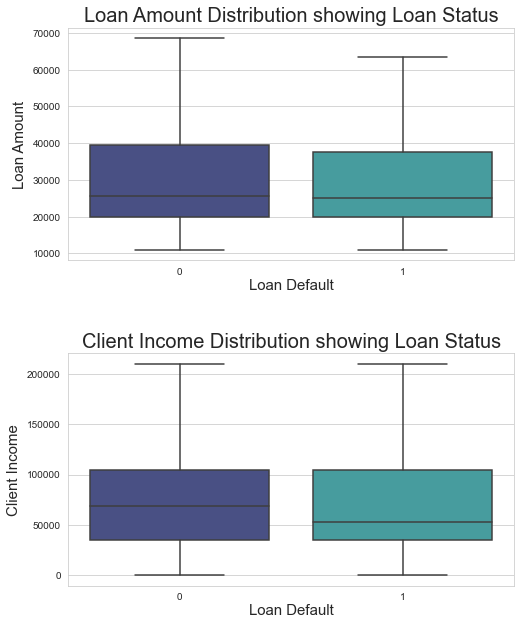

In [12]:
# Plot a box plot showing the distribution of loans collected and their status
plt.figure(figsize=(8,10))
plt.subplot(211)
sns.boxplot(x='loanDefault', y='loanAmount', data=loans,palette='mako',showfliers=False)

plt.xlabel('Loan Default', fontsize=15, labelpad=2)
plt.ylabel('Loan Amount', fontsize=15, labelpad=6)
plt.title('Loan Amount Distribution showing Loan Status', fontsize=20, pad=6);

plt.subplot(212)

# Plot a box plot showing the distribution of client income the status of loans collected
sns.boxplot(x='loanDefault', y='clientIncome', data=loans, palette='mako', showfliers=False)

plt.xlabel('Loan Default', fontsize=15, labelpad=2)
plt.ylabel('Client Income', fontsize=15, labelpad=6)
plt.title('Client Income Distribution showing Loan Status', fontsize=20, pad=6);

plt.subplots_adjust(wspace=0.2, hspace=0.4, top=0.9)

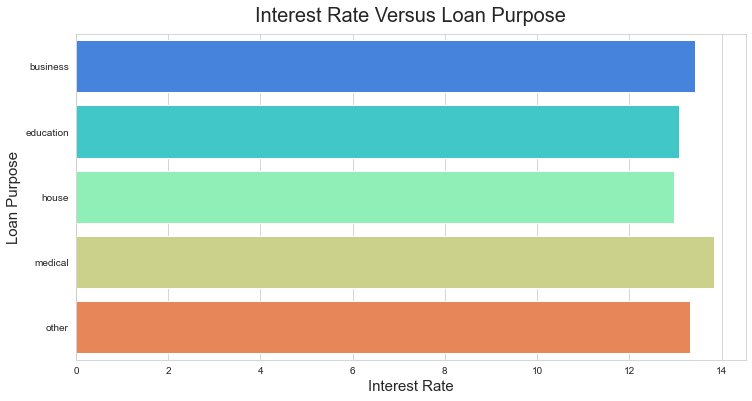

In [13]:
# On an average, interest rates are highest for clients seeking loans for medical reasons, 
# followed by business and other reasons
plt.figure(figsize=(12,6))

data = loans.groupby('clientLoanPurpose')['interestRate'].mean()

sns.barplot(x=data.values, y=data.index, palette='rainbow')

plt.xlabel('Interest Rate', fontsize=15)
plt.ylabel('Loan Purpose', fontsize=15)
plt.title('Interest Rate Versus Loan Purpose', fontsize=20, pad=12);

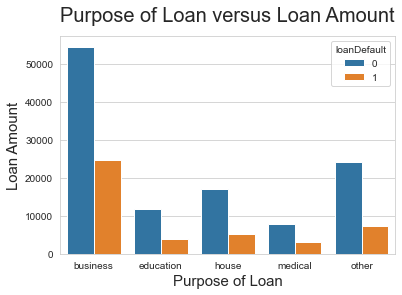

In [14]:
# What do most client's take loans for? What reason has the most defaults?
sns.countplot(x='clientLoanPurpose', data=loans, hue='loanDefault')

plt.xlabel('Purpose of Loan', fontsize=15)
plt.ylabel('Loan Amount', fontsize=15)
plt.title('Purpose of Loan versus Loan Amount', fontsize=20, pad=15);

# Data Pre-Processing
1. Fix wrongly inputed data
2. Handle Missing Values
3. Drop columns
4. One-hot encode categorical columns
5. Build and Train Logistic Regression
6. Build and Train RandomForest
7. Build and Train Artificial Neural Network

### 1.1 Fix wrongly inputed data in `clientState` column

In [15]:
# Replace wrongly entered states
loans['clientState'] = loans['clientState'].str.replace('LAGOS ', 'LAGOS')
loans['clientState'] = loans['clientState'].str.replace('OJO', 'OYO')

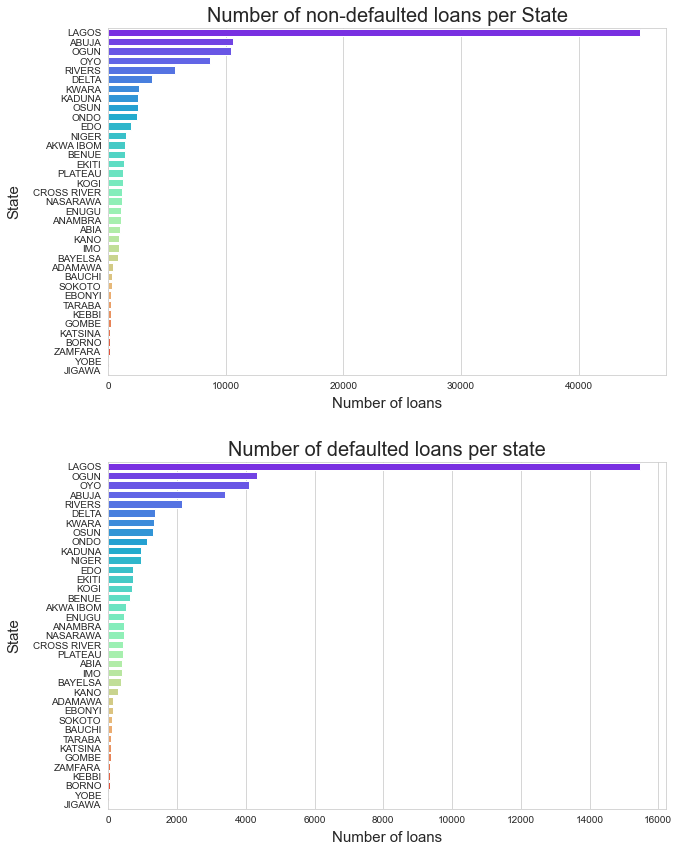

In [16]:
# Plot a barplot of the counts of Non-defaulted loans grouped according to states
plt.figure(figsize=(10,14))
plt.subplot(211)
data = loans[loans['loanDefault']==0].groupby('clientState')['loanDefault'].count().sort_values(ascending=False)

sns.barplot(x=data.values, y=data.index, palette='rainbow')

plt.xlabel('Number of loans',fontsize=15, labelpad=6)
plt.ylabel('State',fontsize=15, labelpad=12)
plt.title('Number of non-defaulted loans per State',fontsize=20, pad=6);

plt.subplot(212)

# Plot a barplot of the counts of Defaulted loans grouped according to states
data = loans[loans['loanDefault']==1].groupby('clientState')['loanDefault'].count().sort_values(ascending=False)

sns.barplot(x=data.values, y=data.index, palette='rainbow')

plt.xlabel('Number of loans',fontsize=15, labelpad=6)
plt.ylabel('State',fontsize=15, labelpad=12)
plt.title('Number of defaulted loans per state',fontsize=20, pad=6);

plt.subplots_adjust(wspace=0.2, hspace=0.25, top=0.9)

### 1.2 Fix wrongly inputed data in `clientAge` column
Upon observation `loans.clientAge.max()` returns `138`. This was most likely an error and the client meant to input `38`

In [17]:
# Check maximum age
loans.clientAge.max()

138

In [18]:
# Reassign the value at the index where this error occurs
loans.loc[1165, 'clientAge'] = 38

### 2.1 Handle missing values in the `incomeVerified column`
- **`Fill Nans with 'False'`**
- **Logic behind it**: missing values are filled in with **`false`**; missing is being translated as **`unverified`**

In [19]:
# Check value counts before filling with 'false'
loans.incomeVerified.value_counts()

false    133286
true      26207
Name: incomeVerified, dtype: int64

In [20]:
# Replace nans in Income verified with False
loans['incomeVerified'] = loans['incomeVerified'].fillna('false')

In [21]:
# This converts incomeVerified to a boolean data type
loans['incomeVerified'] = loans['incomeVerified'] == 'true'

In [22]:
# Check value counts after filling and converting to boolean
loans.incomeVerified.value_counts()

False    133389
True      26207
Name: incomeVerified, dtype: int64

In [23]:
# Remap IncomeVerified with 1:True and 0:False
loans['incomeVerified']=loans['incomeVerified'].map({True:1,False:0})

In [24]:
# Check value counts after remapping
loans.incomeVerified.value_counts()

0    133389
1     26207
Name: incomeVerified, dtype: int64

### 2.2 Handle missing values for `clientMaritalStatus` column
- **`Fill Nans with 'Single'`**
- **Logic behind it**: Upon looking at the data, 6 missing values were encountered **`{24 : F , 26 : M , 29 : F , 33 : M , 34 : F , 36 : M}`**. This dictionary represents the ages and genders of the clients.
- Looking at the values, there's a high likehood of them being Single.

In [25]:
# Fill missing values in with 'Single'
loans['clientMaritalStatus'] = loans['clientMaritalStatus'].fillna('Single')

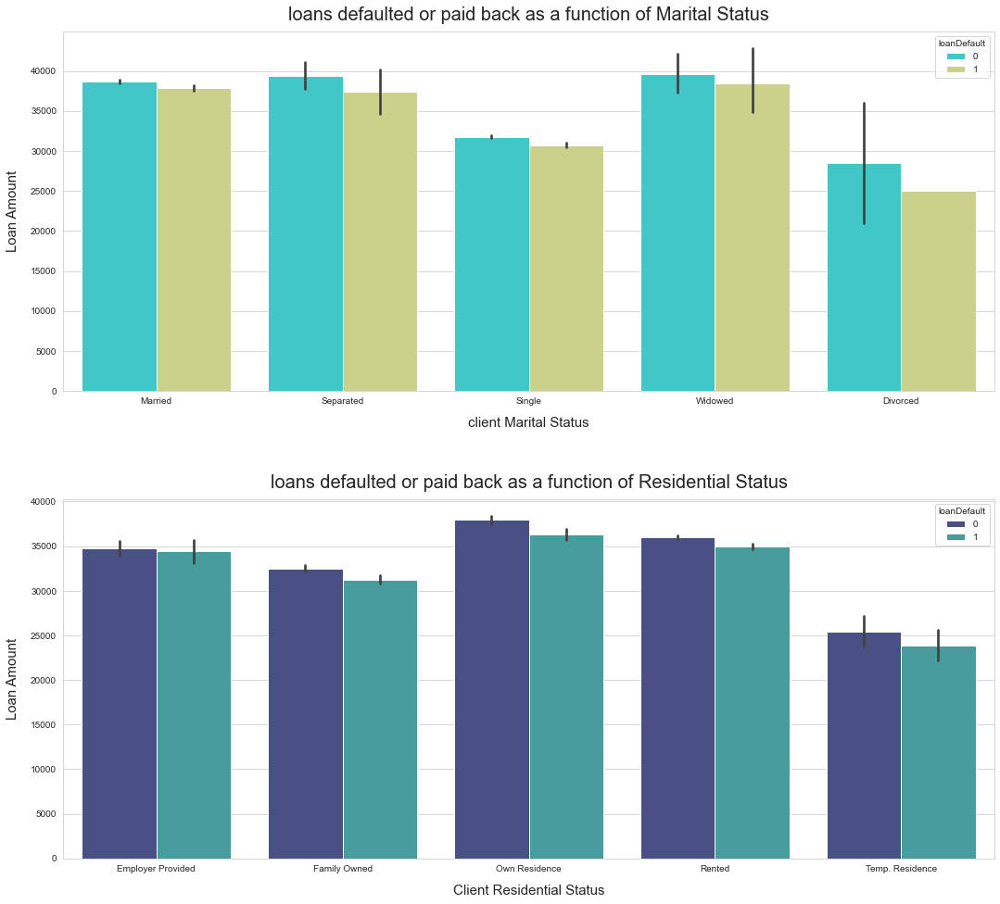

In [26]:
# Plot a barplot of mean loan amounts defaulted on or paid back for different marital status
plt.figure(figsize=(18,16))

plt.subplot(2,1,1)
sns.barplot(x='clientMaritalStatus', y='loanAmount', hue='loanDefault', data=loans, palette='rainbow');

plt.xlabel('client Marital Status',fontsize=15, labelpad=12)
plt.ylabel('Loan Amount',fontsize=15, labelpad=12)
plt.title('loans defaulted or paid back as a function of Marital Status',fontsize=20, pad=12);

# Plot a barplot of mean loan amounts defaulted on or paid back for different residential status
plt.subplot(2,1,2)
sns.barplot(x='clientResidentialStauts', y='loanAmount', hue='loanDefault', data=loans, palette='mako');

plt.xlabel('Client Residential Status',fontsize=15, labelpad=12)
plt.ylabel('Loan Amount',fontsize=15, labelpad=12)
plt.title('loans defaulted or paid back as a function of Residential Status',fontsize=20, pad=12);

plt.subplots_adjust(wspace=0.2, hspace=0.3, top=0.9)

### 2.3 Handle missing values in the `clientTimeAtEmployer` column
- **`Fill Nans with 0`**
- **Logic behind it**: Out of **`4,194`** clients that have Nans indicated in their **`clientTimeAtEmployer`** field, only **`5.41%`** of them have Verified Income sources compared to the overall **`16.42%`** in the entire dataset and **`16.71%`** for the remaining **`155,402`** clients who provided info for the **`clientTimeAtEmployer`** field.
- This could indicate that they are unemployed and as such, filling **`clientTimeAtEmployer`** with **`0`** makes sense.

In [27]:
# Isolate incomeVerified and clientTimeAtEmployer columns and make observations
loans_income_employer = loans[['incomeVerified', 'clientTimeAtEmployer']]

In [28]:
# 5.41% of the clients who did not provide information about clientTimeAtEmployer have verified Income sources
loans_income_employer[loans_income_employer['clientTimeAtEmployer'].isnull()].mean()*100

incomeVerified          5.412494
clientTimeAtEmployer         NaN
dtype: float64

In [29]:
# 16.71% of the clients who provided information about clientTimeAtEmployer have verified Income sources
loans_income_employer[loans_income_employer['clientTimeAtEmployer'].notnull()].mean()*100 

incomeVerified    16.717932
dtype: float64

In [30]:
# 16.42% of all the clients in the dataset provided verified income sources
(loans['incomeVerified'] == True).mean()*100

16.420837614977817

In [31]:
# Strip the '+' added to the end of clients that have worked for more than 36 Months and 
# convert the column to a numeric column
loans['clientTimeAtEmployer'] = loans['clientTimeAtEmployer'].str.rstrip('+')
loans['clientTimeAtEmployer'] = pd.to_numeric(loans['clientTimeAtEmployer'])

In [32]:
# Fill Nans with O
loans['clientTimeAtEmployer'] = loans['clientTimeAtEmployer'].fillna(0)

### Reduce the number of categories in `clientTimeAtEmployer` due to the sparse distribution of values in categories other than `36+`

In [33]:
# Investigate the number of unique groups for 'clientTimeAtEmployer'. 
# There are 40 Unique groups, reduce these to limit numerous columns without much information loss
loans['clientTimeAtEmployer'].unique().shape

(40,)

In [34]:
# Bin the 40 unique values from 'clientTimeAtEmployer' into 6 Intervals of 8 Months each.
# Create a seperate bin for the few negative values found
bins = [-10 ,0 ,8 ,17 ,26 ,35, 36 ]
labels = ['< 0 Months', '0-8 Months', '9-17 Months', '18-26 Months', '27-35 Months', '> 36 Months']

In [35]:
loans['clientTimeAtEmployer'] = pd.cut(loans.clientTimeAtEmployer, bins = bins, labels = labels)

In [36]:
# Check the new categories
loans['clientTimeAtEmployer'].value_counts()

> 36 Months     87294
9-17 Months     17939
0-8 Months      17662
18-26 Months    16080
27-35 Months    13050
< 0 Months       7571
Name: clientTimeAtEmployer, dtype: int64

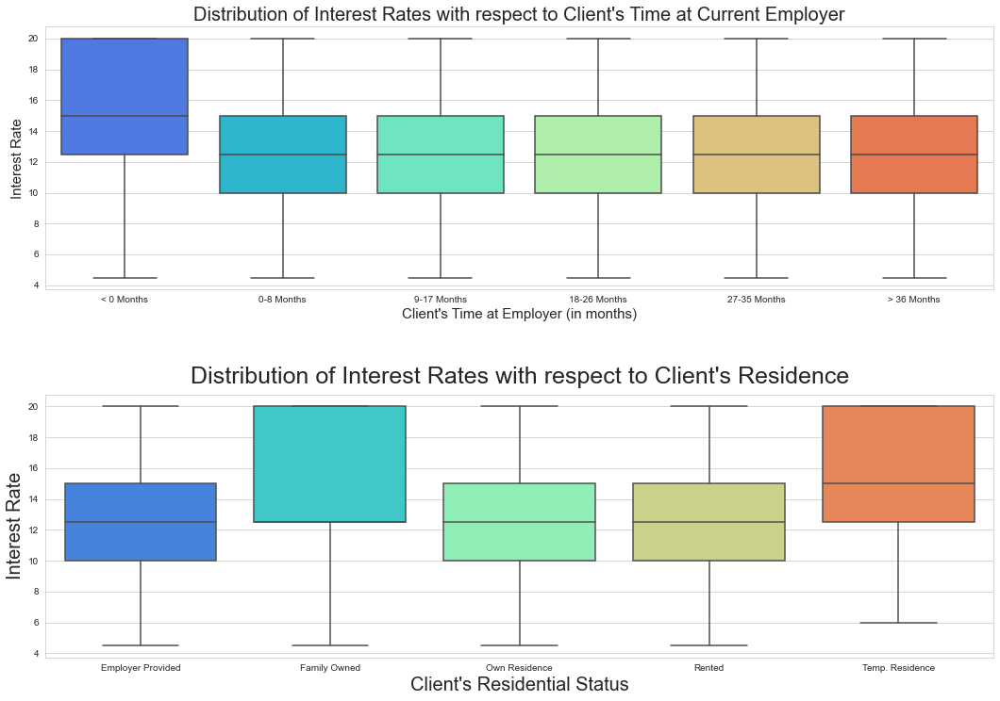

In [37]:
# Plot the distribution of interest rates with respect to client's monthly time at current employer on a boxplot
plt.figure(figsize=(18,12))
plt.subplot(211)

sns.boxplot(x='clientTimeAtEmployer', y='interestRate', data=loans, palette='rainbow',
            order=['< 0 Months', '0-8 Months', '9-17 Months', '18-26 Months', '27-35 Months', '> 36 Months']);

plt.xlabel('Client\'s Time at Employer (in months)', fontsize=15)
plt.ylabel('Interest Rate',fontsize=15)
plt.title('Distribution of Interest Rates with respect to Client\'s Time at Current Employer', fontsize=20);

plt.subplot(212)

# Plot the distribution of interest rates with respect to client's residence on a boxplot
sns.boxplot(x='clientResidentialStauts', y='interestRate', data=loans, palette='rainbow')
plt.xlabel('Client\'s Residential Status', fontsize=20)
plt.ylabel('Interest Rate',fontsize=20)
plt.title('Distribution of Interest Rates with respect to Client\'s Residence', fontsize=25, pad=12);

plt.subplots_adjust(wspace=0.2, hspace=0.4, top=0.9)

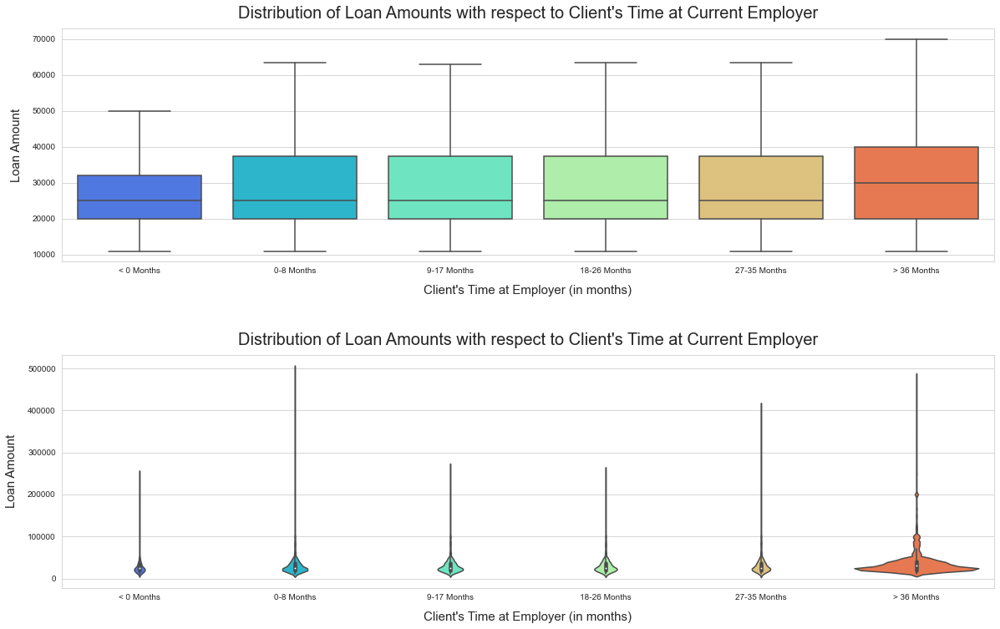

In [38]:
# Plot the distribution of loan amounts with respect to client's monthly time at current employer on a boxplot
plt.figure(figsize=(20,12))
plt.subplot(211)

sns.boxplot(x='clientTimeAtEmployer', y='loanAmount', data=loans, palette='rainbow', showfliers=False,
               order=['< 0 Months', '0-8 Months', '9-17 Months', '18-26 Months', '27-35 Months', '> 36 Months']);

plt.xlabel('Client\'s Time at Employer (in months)', fontsize=15, labelpad = 12)
plt.ylabel('Loan Amount', fontsize=15, labelpad = 12)
plt.title('Distribution of Loan Amounts with respect to Client\'s Time at Current Employer', 
          fontsize=20, pad=12);

plt.subplot(212)
# Plot the distribution of loan amounts with respect to client's monthly time at current employer on a violinplot 
# (better reflector of the distibution's proportion)

sns.violinplot(x='clientTimeAtEmployer', y='loanAmount', data=loans, scale='count', palette='rainbow', split=True,
               order=['< 0 Months', '0-8 Months', '9-17 Months', '18-26 Months', '27-35 Months', '> 36 Months']);

plt.xlabel('Client\'s Time at Employer (in months)', fontsize=15, labelpad = 12)
plt.ylabel('Loan Amount', fontsize=15, labelpad=12)
plt.title('Distribution of Loan Amounts with respect to Client\'s Time at Current Employer', 
          fontsize=20, pad=12);

plt.subplots_adjust(wspace=0.2, hspace=0.4, top=0.9)

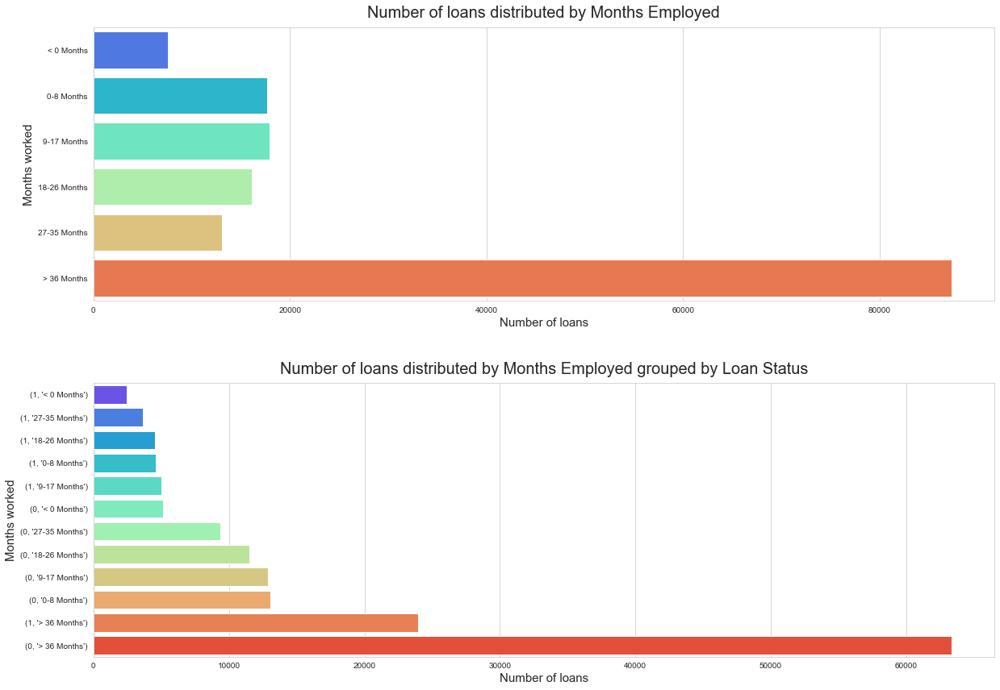

In [39]:
# More than 75% of loans are taken out by people who have worked for 36+ Months
plt.figure(figsize=(20,14))

plt.subplot(211)

data = loans['clientTimeAtEmployer'].value_counts()
sns.barplot(x=data.values, y=data.index, palette='rainbow')
plt.xlabel('Number of loans',fontsize=15)
plt.ylabel('Months worked',fontsize=15)
plt.title('Number of loans distributed by Months Employed',fontsize=20, pad=12);


plt.subplot(212)

# Counts of loans defaulted on and paid with respect to number of months worked at current empolyer
data = loans['clientTimeAtEmployer'].groupby(loans['loanDefault']).value_counts().sort_values()
sns.barplot(x=data.values, y=data.index, palette='rainbow')
plt.xlabel('Number of loans',fontsize=15)
plt.ylabel('Months worked',fontsize=15)
plt.title('Number of loans distributed by Months Employed grouped by Loan Status',fontsize=20, pad=12);

plt.subplots_adjust(wspace=0.2, hspace=0.3, top=0.9)

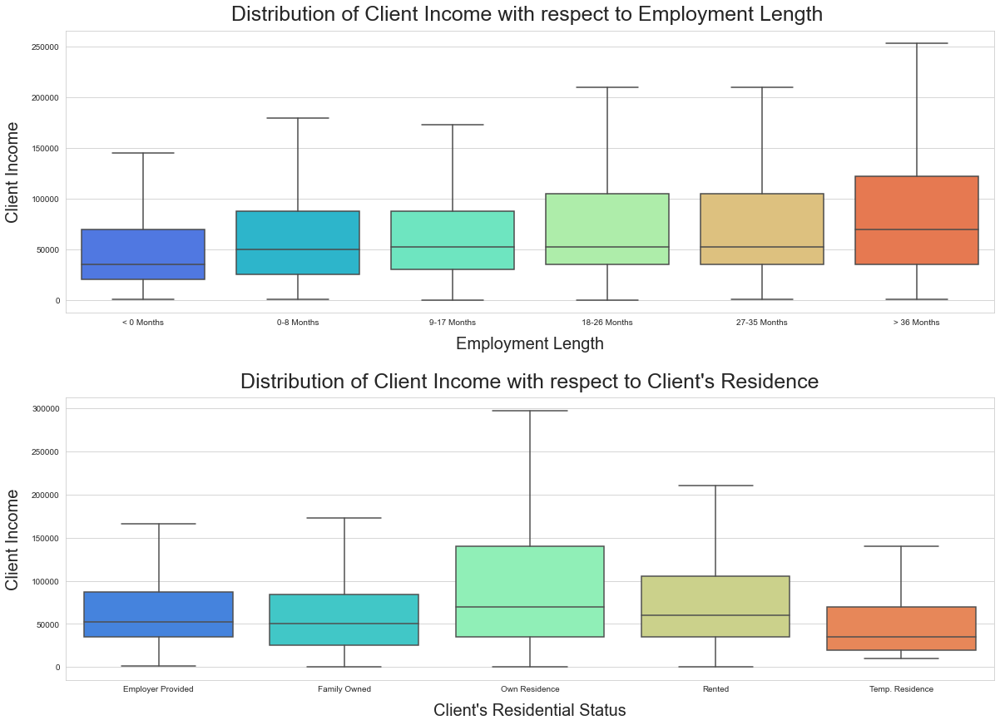

In [40]:
plt.figure(figsize=(20,14))

plt.subplot(211)

# Plot the distribution of client income with respect to client's time at current employer on a boxplot
cols = ['< 0 Months', '0-8 Months', '9-17 Months', '18-26 Months', '27-35 Months', '> 36 Months']
sns.boxplot(x='clientTimeAtEmployer', y='clientIncome', data= loans, order=cols, showfliers=False, palette='rainbow')
plt.xlabel('Employment Length', fontsize=20, labelpad=12)
plt.ylabel('Client Income', fontsize=20, labelpad=12)
plt.title('Distribution of Client Income with respect to Employment Length ', fontsize=25, pad=12);

plt.subplot(212)

# Plot the distribution of client income with respect to client's residence on a boxplot
sns.boxplot(x='clientResidentialStauts', y='clientIncome', data=loans, palette='rainbow', showfliers=False)
plt.xlabel('Client\'s Residential Status', fontsize=20, labelpad=12)
plt.ylabel('Client Income',fontsize=20, labelpad=12)
plt.title('Distribution of Client Income with respect to Client\'s Residence', fontsize=25, pad=12);

plt.subplots_adjust(wspace=0.2, hspace=0.3, top=0.9)

### 2.4 Handle missing values in the `clientNumberPhoneContacts` column
- **`Fill Nans with mean value of clientNumberPhoneContacts grouped by age of client`**
- **Logic behind it**: Plotting **clientNumberPhoneContacts** after grouping by **clientAge** revealed a subtle trend with the two variables; the **mean** of **`clientNumberPhoneContacts`** tends to mostly **increase** gradually with the **age** of the client, save for a few exceptions. It makes more sense to fill the missing values this way compared to backward or forward filling.

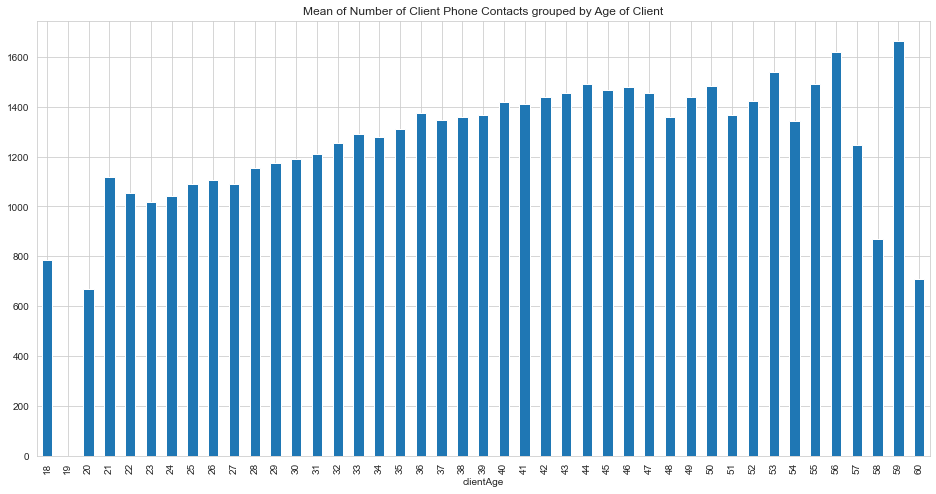

In [41]:
plt.figure(figsize=(16,8))
loans['clientNumberPhoneContacts'].groupby(loans['clientAge']).mean().plot(kind='bar',
                    title= 'Mean of Number of Client Phone Contacts grouped by Age of Client');

In [42]:
# Group by clientAge and transform the Nans in clientAvgCallsPerDay to the mean of the groupby
loans['clientNumberPhoneContacts'] = loans['clientNumberPhoneContacts'].groupby(loans['clientAge']).transform\
                                (lambda x: x.fillna(x.mean()))

In [43]:
# Upon inspection, one NaN still exists. Investigate this:
loans[loans['clientNumberPhoneContacts'].isna()]

,loanId,clientId,clientIncome,incomeVerified,clientAge,clientGender,clientMaritalStatus,clientLoanPurpose,clientResidentialStauts,clientState,clientTimeAtEmployer,clientNumberPhoneContacts,clientAvgCallsPerDay,loanType,loanNumber,applicationDate,approvalDate,declinedDate,disbursementDate,payout_status,dueDate,paidAt,loanAmount,interestRate,loanTerm,max_amount_taken,max_tenor_taken,repaidDate,FirstPaymentDueDate,settleDays,paymentRatio,firstPaymentDefault,loanDefault
97621,302364636300,475193243,105000.0,0,19,FEMALE,Single,other,Own Residence,LAGOS,9-17 Months,NaN,NaN,paylater,3,2018-09-09,2018-09-09,NaN,2018-09-09,SUCCESS,2018-12-08 09:07:15,2018-09-24 04:47:22,27000,12.5,90,0,1,2018-09-24 05:44:57,2018-10-09 12:00:00,-15,0.0,0,0


In [44]:
# Fill the one remaining NaN with the mean of clientNumberPhoneContacts
loans['clientNumberPhoneContacts'] = loans['clientNumberPhoneContacts'].transform(lambda x: x.fillna(x.mean()))

### 2.5 Handle missing values in the `clientAvgCallsPerDay `column
- **`Fill Nans with the mean value of clientAvgCallsPerDay grouped by age of Client`**
- Plotting **`clientAvgCallsPerDay`** after grouping by **`clientAge`** revealed a noticeable trend with the two variables; the **mean** of **`clientAvgCallsPerDay`** **decreases** with the **age** of the client.

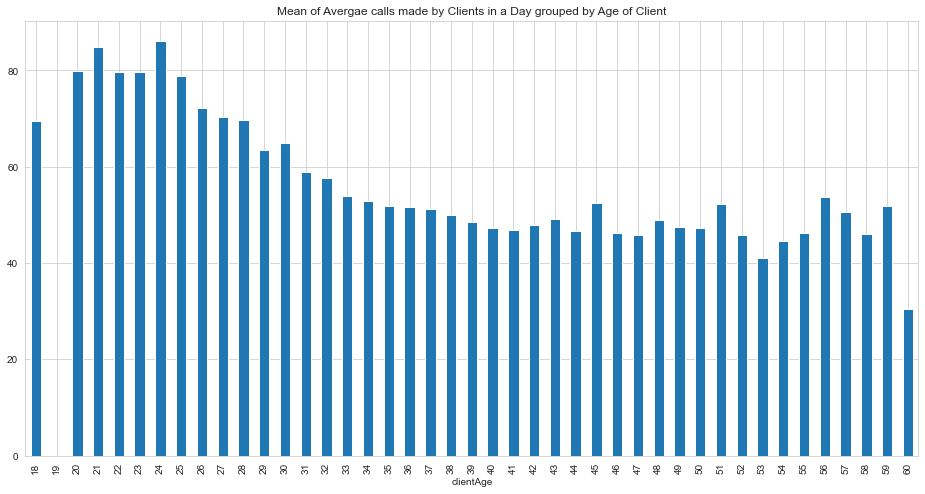

In [45]:
plt.figure(figsize=(16,8))
loans['clientAvgCallsPerDay'].groupby(loans['clientAge']).mean().plot(kind='bar', 
            title= 'Mean of Avergae calls made by Clients in a Day grouped by Age of Client');

In [46]:
# Group by clientAge and transform the Nans in clientAvgCallsPerDay to the mean of the groupby
loans['clientAvgCallsPerDay'] = loans['clientAvgCallsPerDay'].groupby(loans['clientAge']).transform\
                                (lambda x: x.fillna(x.mean()))

In [47]:
# Upon inspection, one NaN still exists. Investigate this:
loans[loans['clientAvgCallsPerDay'].isna()]

,loanId,clientId,clientIncome,incomeVerified,clientAge,clientGender,clientMaritalStatus,clientLoanPurpose,clientResidentialStauts,clientState,clientTimeAtEmployer,clientNumberPhoneContacts,clientAvgCallsPerDay,loanType,loanNumber,applicationDate,approvalDate,declinedDate,disbursementDate,payout_status,dueDate,paidAt,loanAmount,interestRate,loanTerm,max_amount_taken,max_tenor_taken,repaidDate,FirstPaymentDueDate,settleDays,paymentRatio,firstPaymentDefault,loanDefault
97621,302364636300,475193243,105000.0,0,19,FEMALE,Single,other,Own Residence,LAGOS,9-17 Months,1262.055414,NaN,paylater,3,2018-09-09,2018-09-09,NaN,2018-09-09,SUCCESS,2018-12-08 09:07:15,2018-09-24 04:47:22,27000,12.5,90,0,1,2018-09-24 05:44:57,2018-10-09 12:00:00,-15,0.0,0,0


In [48]:
# Fill the one remaining NaN with the mean of clientNumberPhoneContacts
loans['clientAvgCallsPerDay'] = loans['clientAvgCallsPerDay'].transform(lambda x: x.fillna(x.mean()))

### 2.6 Handle missing values in the `clientResidentialStauts `column
- **`Fill Nans with the mode value of clientResidentialStauts grouped by age of Client`**
- **Logic behind it**: Grouping **`clientResidentialStauts`** by **`clientAge`** revealed that **`66.67%`** 18 year olds lived in **`Family Owned`** residences, the only 19 year old lives in her **`Own Residence`**. **`40%`** of the 20 Year olds lived in **`Family Owned`** residences. For ages **`21-53`**, more client's live in **`Rented`** residences. For ages **`54-60`**, more client's lived in their **`Own Residence`**.
- The Nans in this column will be filled with the `mode` value gotten after grouping **`clientResidentialStauts`** by Age.

In [49]:
# Group client residential status by Age and fnd the counts of the values
loans['clientResidentialStauts'].groupby(loans['clientAge']).value_counts()

clientAge  clientResidentialStauts
18         Family Owned                  2
           Rented                        1
19         Own Residence                 1
20         Family Owned                  4
           Rented                        3
           Own Residence                 2
           Employer Provided             1
21         Rented                      762
           Family Owned                598
           Own Residence               224
           Employer Provided            69
           Temp. Residence               4
22         Rented                     1404
           Family Owned               1017
           Own Residence               336
           Employer Provided           155
           Temp. Residence               9
23         Rented                     1903
           Family Owned               1330
           Own Residence               503
           Employer Provided           202
           Temp. Residence              12
24         Rented  

In [50]:
# Group by clientAge and transform the Nans in clientResidentialStauts to the mode of the groupby
loans['clientResidentialStauts'] = loans['clientResidentialStauts'].groupby(loans['clientAge']).\
                                    transform(lambda x: x.fillna(x.mode()[0]))

In [51]:
# Create a new feature, loan to income ratio 
loans['loan_income_ratio']= loans['loanAmount']/loans['clientIncome']

## 3. Drop Columns
- **loanId and clientId**: Values are unique to individual clients
- **clientState**: Besides LAGOS that accounts for `38.01%` of the total clients and the next 3 states `OGUN: 9.27%`, `ABUJA: 8.77%` and `OYO: 7.97%`, data from the other states are sparse.
- **loanType**: All loans are `paylater (now Carbon)` loans
- **declinedDate**: `99.995%` Missing values
- **payout_status**: All loans have `SUCCESS` status
- **paidAt**: This feature is only known after the final payments have been made, hence it's a data leak

In [52]:
# Drop columns
cols = ['loanId', 'clientId', 'clientState', 'loanType','declinedDate', 'payout_status','paidAt']
loans = loans.drop(cols, axis=1)

### Encode `month` Information from date columns and drop the columns

In [53]:
# Loop through datetime columns and create new columns with the number of the month appended to the column name.
for i in dates:
    months_order = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 'Unpaid']
    loans[i+'_Month'] = pd.Categorical(loans[i].dt.month, categories=months_order, ordered=True)

In [54]:
# Drop the datetime columns
loans = loans.drop(dates, axis=1)

In [55]:
loans['repaidDate_Month'] = loans['repaidDate_Month'].fillna('Unpaid')

In [56]:
loans['repaidDate_Month'].dtype

CategoricalDtype(categories=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 'Unpaid'], ordered=True)

### Check Correlation of Numeric Features

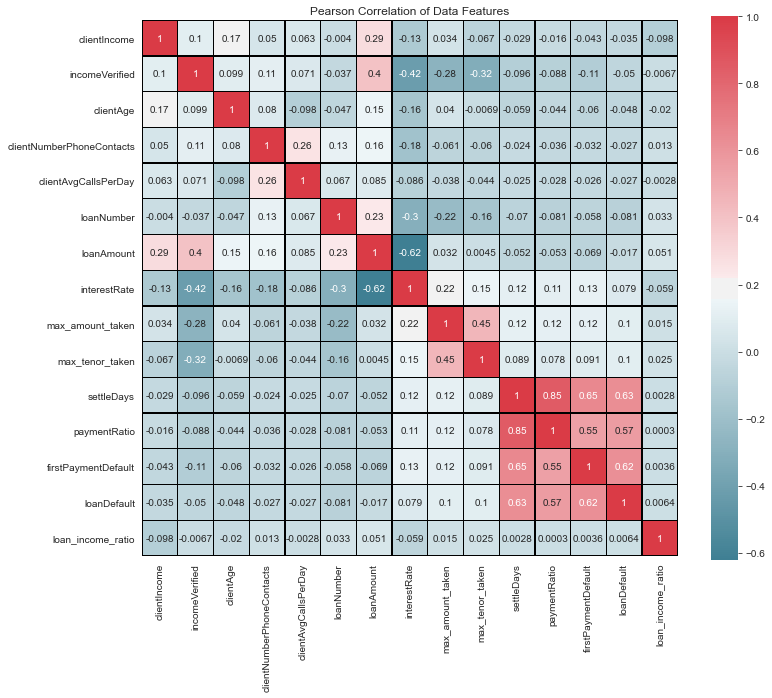

In [57]:
plt.figure(figsize=(12,10))
plt.title('Pearson Correlation of Data Features')
sns.heatmap(loans.corr(), linewidths=0.25, vmax=1.0, square=True,
           cmap=sns.diverging_palette(220, 10, as_cmap=True), linecolor='black', annot=True);

In [58]:
loans.to_csv('preprocessed_loans.csv')

## 4. One Hot Encode Categorical Columns

In [59]:
#'clientState'
cat_cols = ['clientGender', 'clientMaritalStatus', 'clientLoanPurpose','clientResidentialStauts','clientTimeAtEmployer',
            'loanTerm','applicationDate_Month','approvalDate_Month', 'disbursementDate_Month','dueDate_Month',
            'repaidDate_Month','FirstPaymentDueDate_Month']
ohe_cols = pd.get_dummies(loans[cat_cols])
ohe_loans = pd.concat([loans, ohe_cols], axis=1)
ohe_loans = ohe_loans.drop(cat_cols, axis=1)

In [60]:
X_df = ohe_loans.copy()
X_df_x = X_df.drop('loanDefault', axis=1)

In [61]:
X = ohe_loans.drop('loanDefault', axis=1).values
y = ohe_loans['loanDefault'].values

## Use an ExtraTreeClassifier to find most important features

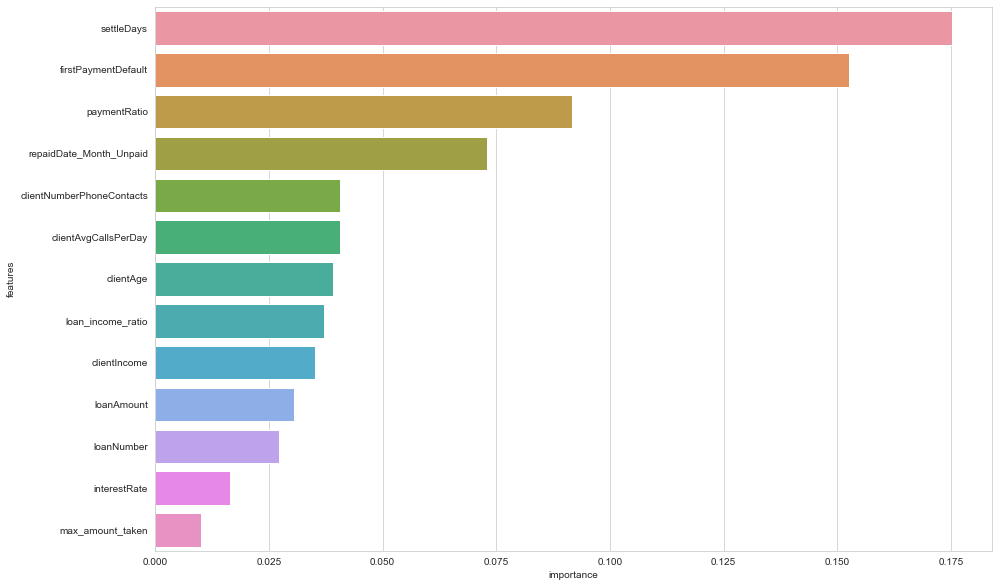

In [62]:
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

# Initialize a random forest estimator
forest = ExtraTreesClassifier(n_estimators=50,random_state=0)

# Fit the input matrix and target values to the classifier
forest.fit(X, y)

# Retrieve the computed feature importance
importances = forest.feature_importances_

# Plot the feature importance
plot_data = pd.DataFrame({'features' : pd.Series(X_df_x.columns),'importance' : pd.Series(importances)})
plt.figure(figsize=(15,10))
plot_data = plot_data.sort_values('importance',ascending=False)
plot_data = plot_data[plot_data['importance'] > 0.01]
ax = sns.barplot(x=plot_data['importance'],y=plot_data['features'],)

In [63]:
# Use the most important features [mif] as X
mifeat_df_X = ohe_loans[plot_data.iloc[:,0].values].values

In [64]:
mifeat_X_copy = pd.DataFrame(mifeat_df_X, columns = plot_data.iloc[:,0])

In [65]:
mifeat_X_copy.head()

features,settleDays,firstPaymentDefault,paymentRatio,repaidDate_Month_Unpaid,clientNumberPhoneContacts,clientAvgCallsPerDay,clientAge,loan_income_ratio,clientIncome,loanAmount,loanNumber,interestRate,max_amount_taken
0,-9.0,0.0,0.0,0.0,458.000000,6.792453,38.0,0.632029,66452.66,42000.0,1.0,6.0,1.0
1,6.0,0.0,0.0,0.0,708.000000,2.144928,35.0,0.571429,35000.00,20000.0,1.0,6.0,0.0
2,23.0,1.0,0.0,0.0,622.000000,36.095238,47.0,0.822837,162851.11,134000.0,1.0,6.0,0.0
3,-7.0,0.0,0.0,0.0,1289.979347,53.845718,33.0,0.626661,55053.68,34500.0,1.0,6.0,1.0
4,19.0,1.0,0.0,0.0,608.000000,85.528481,30.0,0.622809,32112.55,20000.0,1.0,6.0,1.0


In [66]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score

## Split data into train and test sets

In [67]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(mifeat_df_X, y, test_size=0.25, random_state=3005)

## Scale using StandardScaler

In [68]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Oversample the training set of the minority class `1` using `SMOTE`

In [69]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=3005, sampling_strategy = 'minority')
X_train_bal, y_train_bal = smote.fit_sample(X_train, y_train)

In [70]:
# Measure model's performace for training and testing sets
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        print("Train Result:\n")
        print("accuracy score: {0:.4f}\n".format(accuracy_score(y_train, clf.predict(X_train))))
        print("Classification Report: \n {}\n".format(classification_report(y_train, clf.predict(X_train))))
        print("Confusion Matrix: \n {}\n".format(confusion_matrix(y_train, clf.predict(X_train))))
        print("ROC_AUC_Score: \n {}\n".format(roc_auc_score(y_train, clf.predict_proba(X_train)[:, 1])))
        
        res = cross_val_score(clf, X_train, y_train, cv=10, scoring='accuracy')
        print("Average Accuracy: \t {0:.4f}".format(np.mean(res)))
        print("Accuracy SD: \t\t {0:.4f}".format(np.std(res)))
        
    elif train==False:
        print("Test Result:\n")        
        print("accuracy score: {0:.4f}\n".format(accuracy_score(y_test, clf.predict(X_test))))
        print("Classification Report: \n {}\n".format(classification_report(y_test, clf.predict(X_test))))
        print("Confusion Matrix: \n {}\n".format(confusion_matrix(y_test, clf.predict(X_test))))
        print("ROC_AUC_Score: \n {}\n".format(roc_auc_score(y_test, clf.predict_proba(X_test)[:, 1])))

## Building Logistic Regression

In [71]:
from sklearn.linear_model import LogisticRegression

logit_clf = LogisticRegression()
logit_clf.fit(X_train_bal, y_train_bal)

LogisticRegression()

In [72]:
# Test model, make predictions and see the predictions next to the actual y values
logit_predictions = logit_clf.predict(X_test)

# format and print
pd.DataFrame(data = {'predicted values':logit_predictions, 'actual value': list(int(val) for val in y_test)}).sample(10)

,predicted values,actual value
14411,0,0
32081,1,1
11609,0,0
20423,0,0
8213,1,0
12578,0,0
33661,0,0
37659,0,0
36752,0,0
30092,0,0


In [73]:
print_score(logit_clf, X_train_bal, y_train_bal, X_test, y_test, train=True)

Train Result:

accuracy score: 0.8203

Classification Report: 
               precision    recall  f1-score   support

           0       0.77      0.91      0.83     86601
           1       0.89      0.73      0.80     86601

    accuracy                           0.82    173202
   macro avg       0.83      0.82      0.82    173202
weighted avg       0.83      0.82      0.82    173202


Confusion Matrix: 
 [[78588  8013]
 [23113 63488]]

ROC_AUC_Score: 
 0.8953718999103366

Average Accuracy: 	 0.8202
Accuracy SD: 		 0.0031


In [74]:
print_score(logit_clf, X_train_bal, y_train_bal, X_test, y_test, train=False)

Test Result:

accuracy score: 0.8566

Classification Report: 
               precision    recall  f1-score   support

           0       0.89      0.91      0.90     28720
           1       0.76      0.72      0.74     11179

    accuracy                           0.86     39899
   macro avg       0.83      0.81      0.82     39899
weighted avg       0.85      0.86      0.86     39899


Confusion Matrix: 
 [[26186  2534]
 [ 3186  7993]]

ROC_AUC_Score: 
 0.8905895557876748



In [75]:
# Visualizing the ROC Curve
import plotly.express as px
from sklearn.metrics import roc_curve, auc

y_score = logit_clf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

## Build RandomForestClassifier

In [76]:
# Initialise a RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier()

In [77]:
# Fit model to training data
rf_clf.fit(X_train_bal, y_train_bal)

RandomForestClassifier()

In [78]:
# Test model, make predictions and see the predictions next to the actual y values
rf_predictions = rf_clf.predict(X_test)

# format and print
pd.DataFrame(data = {'predicted values':rf_predictions, 'actual value': list(int(val) for val in y_test)}).sample(10)

,predicted values,actual value
1628,1,1
6791,0,0
21008,0,0
29641,0,0
21088,1,1
14655,0,0
5537,1,0
8435,0,0
974,1,0
1913,0,0


### Measure Baseline model's Performance after training and testing

In [79]:
print_score(rf_clf, X_train_bal, y_train_bal, X_test, y_test, train=True)

Train Result:

accuracy score: 1.0000

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     86601
           1       1.00      1.00      1.00     86601

    accuracy                           1.00    173202
   macro avg       1.00      1.00      1.00    173202
weighted avg       1.00      1.00      1.00    173202


Confusion Matrix: 
 [[86601     0]
 [    6 86595]]

ROC_AUC_Score: 
 0.9999999993333096

Average Accuracy: 	 0.9046
Accuracy SD: 		 0.0545


In [80]:
print_score(rf_clf, X_train_bal, y_train_bal, X_test, y_test, train=False)

Test Result:

accuracy score: 0.8615

Classification Report: 
               precision    recall  f1-score   support

           0       0.88      0.94      0.91     28720
           1       0.81      0.66      0.73     11179

    accuracy                           0.86     39899
   macro avg       0.84      0.80      0.82     39899
weighted avg       0.86      0.86      0.86     39899


Confusion Matrix: 
 [[26981  1739]
 [ 3787  7392]]

ROC_AUC_Score: 
 0.8923276887548555



In [81]:
# Visualizing the ROC Curve
import plotly.express as px
from sklearn.metrics import roc_curve, auc

y_score = rf_clf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()



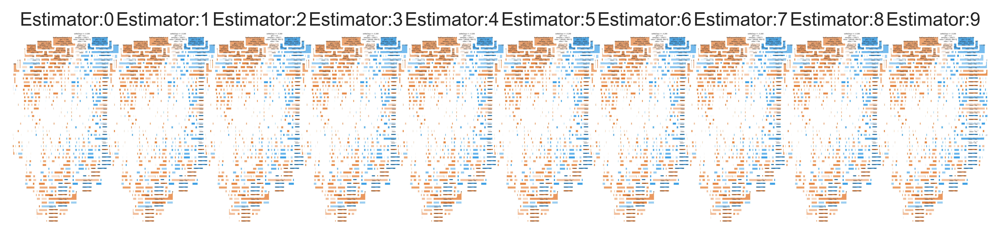

In [285]:
from sklearn.tree import export_graphviz
from sklearn import tree
from graphviz import Source
from subprocess import call
columns_ = mifeat_X_copy.columns
    
estimated_tree = rf_clf.estimators_[10]
fig, axes = plt.subplots(nrows = 1, ncols = 10, figsize = (10, 2), dpi = 900)
for index in range(0, 10):
    graph = tree.plot_tree( rf_clf.estimators_[0], feature_names = mifeat_X_copy.columns, class_names=["No","Yes"],filled = True, rounded = True, ax = axes[index])
    axes[index].set_title("Estimator:" + str(index), fontsize = 11)
fig.savefig('random.png')

## Hyperparameter Tuning

from sklearn.model_selection import GridSearchCV
hyperparameters = {'max_features':['auto'],
                   'max_depth': [None, 1, 10, 20],
                   'min_samples_leaf': [1, 2, 4],
                   'min_samples_split': [2, 5, 10],
                   'n_estimators': [80, 100, 120],
                   'criterion': ['gini', 'entropy']}
rf_grid = GridSearchCV(rf_clf, hyperparameters, cv = 10, n_jobs = -1, verbose = 2)
rf_grid.fit(X_train_bal, y_train_bal)

rf_grid.best_params_

### The best parameters obtained after running GridSearchCV were:
```
{'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 120}```

rf_clf.set_params(criterion = 'entropy', max_features = 'auto', max_depth = None, 
               min_samples_leaf = 1, min_samples_split = 2, n_estimators = 120)

print_score(rf_clf, X_train;kiu_bal, y_train_bal, X_test, y_test, train=True)

print_score(rf_clf, X_train_bal, y_train_bal, X_test, y_test, train=False)

import plotly.express as px
from sklearn.metrics import roc_curve, auc

y_score = rf_clf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

In [286]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.layers import Dropout
from sklearn.model_selection import cross_val_score
from tensorflow.keras.models import Sequential
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from tensorflow.keras.callbacks import EarlyStopping

In [287]:
# Create a Densely connected neural network, initiate early stopping to prevent overfitting to training data
classifier = Sequential()
classifier.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
classifier.add(Dense(32, input_dim=X_train.shape[1], activation='relu'))
classifier.add(Dense(1, activation='sigmoid'))
classifier.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

classifier.fit(
    X_train, 
    y_train, 
    epochs=500, 
    batch_size=16, 
    callbacks=[EarlyStopping(monitor='acc')])

Epoch 1/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.3204 - accuracy: 0.8705
Epoch 2/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.3108 - accuracy: 0.8736
Epoch 3/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.3078 - accuracy: 0.8747
Epoch 4/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.3054 - accuracy: 0.8754
Epoch 5/500
7482/7482 [==============================] - 5629s 752ms/step - loss: 0.3037 - accuracy: 0.8756
Epoch 6/500
7482/7482 [==============================] - 30s 4ms/step - loss: 0.3024 - accuracy: 0.8757
Epoch 7/500
7482/7482 [==============================] - 26s 3ms/step - loss: 0.3015 - accuracy: 0.8758
Epoch 8/500
7482/7482 [==============================] - 42s 6ms/step - loss: 0.3006 - accuracy: 0.8763
Epoch 9/500
7482/7482 [==============================] - 39s 5ms/step - loss: 0.3001 - accuracy: 0.8762
Epoch 10/500
7482/7482 [==============================] - 41

7482/7482 [==============================] - 34s 5ms/step - loss: 0.2916 - accuracy: 0.8789
Epoch 54/500
7482/7482 [==============================] - 37s 5ms/step - loss: 0.2916 - accuracy: 0.8788
Epoch 55/500
7482/7482 [==============================] - 42s 6ms/step - loss: 0.2916 - accuracy: 0.8792
Epoch 56/500
7482/7482 [==============================] - 42s 6ms/step - loss: 0.2912 - accuracy: 0.8794
Epoch 57/500
7482/7482 [==============================] - 41s 6ms/step - loss: 0.2914 - accuracy: 0.8790
Epoch 58/500
7482/7482 [==============================] - 36s 5ms/step - loss: 0.2914 - accuracy: 0.8794
Epoch 59/500
7482/7482 [==============================] - 35s 5ms/step - loss: 0.2915 - accuracy: 0.8795
Epoch 60/500
7482/7482 [==============================] - 35s 5ms/step - loss: 0.2911 - accuracy: 0.8795
Epoch 61/500
7482/7482 [==============================] - 35s 5ms/step - loss: 0.2913 - accuracy: 0.8790
Epoch 62/500
7482/7482 [==============================] - 37s 5ms/st

7482/7482 [==============================] - 15s 2ms/step - loss: 0.2879 - accuracy: 0.8808
Epoch 106/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2877 - accuracy: 0.8809
Epoch 107/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2878 - accuracy: 0.8805
Epoch 108/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2877 - accuracy: 0.8809
Epoch 109/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2876 - accuracy: 0.8809
Epoch 110/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2875 - accuracy: 0.8811
Epoch 111/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2873 - accuracy: 0.8810
Epoch 112/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2873 - accuracy: 0.8804
Epoch 113/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2871 - accuracy: 0.8806
Epoch 114/500
7482/7482 [==============================] - 1

7482/7482 [==============================] - 16s 2ms/step - loss: 0.2857 - accuracy: 0.8814
Epoch 158/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2860 - accuracy: 0.8813
Epoch 159/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2855 - accuracy: 0.8816
Epoch 160/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2860 - accuracy: 0.8811
Epoch 161/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2854 - accuracy: 0.8814
Epoch 162/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2854 - accuracy: 0.8816
Epoch 163/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2854 - accuracy: 0.8817
Epoch 164/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2855 - accuracy: 0.8815
Epoch 165/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2853 - accuracy: 0.8814
Epoch 166/500
7482/7482 [==============================] - 1

7482/7482 [==============================] - 16s 2ms/step - loss: 0.2840 - accuracy: 0.8820
Epoch 210/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2839 - accuracy: 0.8820
Epoch 211/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2841 - accuracy: 0.8821
Epoch 212/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2839 - accuracy: 0.8822
Epoch 213/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2842 - accuracy: 0.8820
Epoch 214/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2839 - accuracy: 0.8822
Epoch 215/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2841 - accuracy: 0.8817
Epoch 216/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2842 - accuracy: 0.8821
Epoch 217/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2839 - accuracy: 0.8821
Epoch 218/500
7482/7482 [==============================] - 1

Epoch 235/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2837 - accuracy: 0.8823
Epoch 236/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2834 - accuracy: 0.8827
Epoch 237/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2834 - accuracy: 0.8823
Epoch 238/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2836 - accuracy: 0.8821
Epoch 239/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2834 - accuracy: 0.8830
Epoch 240/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2837 - accuracy: 0.8823
Epoch 241/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2834 - accuracy: 0.8825
Epoch 242/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2835 - accuracy: 0.8826
Epoch 243/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2836 - accuracy: 0.8826
Epoch 244/500
7482/7482 [=====================

Epoch 261/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2828 - accuracy: 0.8827
Epoch 262/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2828 - accuracy: 0.8828
Epoch 263/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2829 - accuracy: 0.8825
Epoch 264/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2830 - accuracy: 0.8827
Epoch 265/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2829 - accuracy: 0.8826
Epoch 266/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2830 - accuracy: 0.8827
Epoch 267/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2831 - accuracy: 0.8825
Epoch 268/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2827 - accuracy: 0.8823
Epoch 269/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2831 - accuracy: 0.8829
Epoch 270/500
7482/7482 [=====================

7482/7482 [==============================] - 17s 2ms/step - loss: 0.2828 - accuracy: 0.8829
Epoch 288/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2827 - accuracy: 0.8830
Epoch 289/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2828 - accuracy: 0.8827
Epoch 290/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2822 - accuracy: 0.8830
Epoch 291/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2826 - accuracy: 0.8834
Epoch 292/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2826 - accuracy: 0.8830
Epoch 293/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2827 - accuracy: 0.8830
Epoch 294/500
7482/7482 [==============================] - 18s 2ms/step - loss: 0.2824 - accuracy: 0.8828
Epoch 295/500
7482/7482 [==============================] - 17s 2ms/step - loss: 0.2826 - accuracy: 0.8831
Epoch 296/500
7482/7482 [==============================] - 1

7482/7482 [==============================] - 15s 2ms/step - loss: 0.2830 - accuracy: 0.8826
Epoch 314/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2823 - accuracy: 0.8828
Epoch 315/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2821 - accuracy: 0.8831
Epoch 316/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2819 - accuracy: 0.8830
Epoch 317/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2822 - accuracy: 0.8829
Epoch 318/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2820 - accuracy: 0.8826
Epoch 319/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2821 - accuracy: 0.8827
Epoch 320/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2823 - accuracy: 0.8832
Epoch 321/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2819 - accuracy: 0.8829
Epoch 322/500
7482/7482 [==============================] - 1

7482/7482 [==============================] - 25s 3ms/step - loss: 0.2817 - accuracy: 0.8828
Epoch 366/500
7482/7482 [==============================] - 28s 4ms/step - loss: 0.2815 - accuracy: 0.8835
Epoch 367/500
7482/7482 [==============================] - 25s 3ms/step - loss: 0.2816 - accuracy: 0.8835
Epoch 368/500
7482/7482 [==============================] - 23s 3ms/step - loss: 0.2814 - accuracy: 0.8834
Epoch 369/500
7482/7482 [==============================] - 23s 3ms/step - loss: 0.2817 - accuracy: 0.8834
Epoch 370/500
7482/7482 [==============================] - 23s 3ms/step - loss: 0.2810 - accuracy: 0.8836
Epoch 371/500
7482/7482 [==============================] - 22s 3ms/step - loss: 0.2816 - accuracy: 0.8839
Epoch 372/500
7482/7482 [==============================] - 26s 4ms/step - loss: 0.2814 - accuracy: 0.8836
Epoch 373/500
7482/7482 [==============================] - 23s 3ms/step - loss: 0.2814 - accuracy: 0.8837
Epoch 374/500
7482/7482 [==============================] - 3

Epoch 417/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2810 - accuracy: 0.8837
Epoch 418/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2812 - accuracy: 0.8833
Epoch 419/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2813 - accuracy: 0.8833
Epoch 420/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2812 - accuracy: 0.8838
Epoch 421/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2810 - accuracy: 0.8841
Epoch 422/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2809 - accuracy: 0.8835
Epoch 423/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2813 - accuracy: 0.8836
Epoch 424/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2810 - accuracy: 0.8840
Epoch 425/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2809 - accuracy: 0.8838
Epoch 426/500
7482/7482 [=====================

7482/7482 [==============================] - 20s 3ms/step - loss: 0.2808 - accuracy: 0.8838
Epoch 444/500
7482/7482 [==============================] - 20s 3ms/step - loss: 0.2807 - accuracy: 0.8841
Epoch 445/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2811 - accuracy: 0.8839
Epoch 446/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2810 - accuracy: 0.8841
Epoch 447/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2808 - accuracy: 0.8838
Epoch 448/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2815 - accuracy: 0.8838
Epoch 449/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2809 - accuracy: 0.8843
Epoch 450/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2820 - accuracy: 0.8843
Epoch 451/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2807 - accuracy: 0.8839
Epoch 452/500
7482/7482 [==============================] - 1

Epoch 469/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2804 - accuracy: 0.8839
Epoch 470/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2808 - accuracy: 0.8837
Epoch 471/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2806 - accuracy: 0.8841
Epoch 472/500
7482/7482 [==============================] - 16s 2ms/step - loss: 0.2806 - accuracy: 0.8842
Epoch 473/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2806 - accuracy: 0.8838
Epoch 474/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2808 - accuracy: 0.8842
Epoch 475/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2805 - accuracy: 0.8842
Epoch 476/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2807 - accuracy: 0.8840
Epoch 477/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2805 - accuracy: 0.8837
Epoch 478/500
7482/7482 [=====================

7482/7482 [==============================] - 15s 2ms/step - loss: 0.2803 - accuracy: 0.8838
Epoch 496/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2803 - accuracy: 0.8838
Epoch 497/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2806 - accuracy: 0.8836
Epoch 498/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2804 - accuracy: 0.8837
Epoch 499/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2809 - accuracy: 0.8842
Epoch 500/500
7482/7482 [==============================] - 15s 2ms/step - loss: 0.2800 - accuracy: 0.8842


In [288]:
# Function that prints metrics for train and test sets
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        print("Train Result:\n")
        print("accuracy score: {0:.4f}\n".format(accuracy_score(y_train, (clf.predict(X_train) > 0.5))))
        print("Classification Report: \n {}\n".format(classification_report(y_train, (clf.predict(X_train) > 0.5))))
        print("Confusion Matrix: \n {}\n".format(confusion_matrix(y_train, (clf.predict(X_train) > 0.5))))
        print("ROC_AUC_Score: \n {}\n".format(roc_auc_score(y_train, (clf.predict_proba(X_train)))))

    elif train==False:
        print("Test Result:\n")        
        print("accuracy score: {0:.4f}\n".format(accuracy_score(y_test, clf.predict(X_test) > 0.5)))
        print("Classification Report: \n {}\n".format(classification_report(y_test, clf.predict(X_test) > 0.5)))
        print("Confusion Matrix: \n {}\n".format(confusion_matrix(y_test, clf.predict(X_test) > 0.5)))
        print("ROC_AUC_Score: \n {}\n".format(roc_auc_score(y_test, clf.predict_proba(X_test))))

In [289]:
# Print training metrics
print_score(classifier, X_train, y_train, X_test, y_test, train=True)

Train Result:

accuracy score: 0.8848

Classification Report: 
               precision    recall  f1-score   support

           0       0.88      0.98      0.92     86601
           1       0.91      0.65      0.76     33096

    accuracy                           0.88    119697
   macro avg       0.89      0.81      0.84    119697
weighted avg       0.89      0.88      0.88    119697


Confusion Matrix: 
 [[84471  2130]
 [11657 21439]]

ROC_AUC_Score: 
 0.9176037052361677



In [290]:
# Print testing metrics
print_score(classifier, X_train, y_train, X_test, y_test, train=False)

Test Result:

accuracy score: 0.8654

Classification Report: 
               precision    recall  f1-score   support

           0       0.86      0.97      0.91     28720
           1       0.87      0.61      0.72     11179

    accuracy                           0.87     39899
   macro avg       0.87      0.79      0.81     39899
weighted avg       0.87      0.87      0.86     39899


Confusion Matrix: 
 [[27726   994]
 [ 4377  6802]]

ROC_AUC_Score: 
 0.8911850752418047



#  Model Performances
## model performance metrics

In [291]:
from sklearn.metrics import cohen_kappa_score, recall_score, precision_score, roc_auc_score, f1_score, accuracy_score
import plotly.figure_factory
import warnings
warnings.filterwarnings("ignore")
import io
import plotly.offline as py#visualization
py.init_notebook_mode()#visualization
import plotly.graph_objs as go#visualization
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import os

#gives model report in dataframe
def model_report(model,training_x,testing_x,training_y,testing_y,name) :
    if name == "NN":
        
        model.fit(training_x,training_y)
        predictions  = model.predict(testing_x)
        accuracy     = accuracy_score(testing_y,predictions > 0.5)
        recallscore  = recall_score(testing_y,predictions >0.5)
        precision    = precision_score(testing_y,predictions>0.5)
        roc_auc      = roc_auc_score(testing_y,predictions>0.5)
        f1score      = f1_score(testing_y,predictions>0.5) 
        kappa_metric = cohen_kappa_score(testing_y,predictions>0.5)
    else:
        model.fit(training_x,training_y)
        predictions  = model.predict(testing_x)
        accuracy     = accuracy_score(testing_y,predictions)
        recallscore  = recall_score(testing_y,predictions)
        precision    = precision_score(testing_y,predictions)
        roc_auc      = roc_auc_score(testing_y,predictions)
        f1score      = f1_score(testing_y,predictions) 
        kappa_metric = cohen_kappa_score(testing_y,predictions)

    df = pd.DataFrame({"Model"           : [name],
                       "Accuracy_score"  : [accuracy],
                       "Recall_score"    : [recallscore],
                       "Precision"       : [precision],
                       "f1_score"        : [f1score],
                       "Area_under_curve": [roc_auc],
                       "Kappa_metric"    : [kappa_metric],
                      })
    return df

#outputs for every model
model1 = model_report(logit_clf,X_train_bal,X_test,y_train_bal,y_test,
                      "Logistic Regression")

model2 = model_report(rf_clf,X_train_bal,X_test,y_train_bal,y_test,
                      "Random Forest Classifier")

model3 = model_report(classifier, X_train_bal,X_test,y_train_bal,y_test, "NN") #  "ANN"

#concat all models
model_performances = pd.concat([model1,model2,model3],axis = 0).reset_index()

model_performances = model_performances.drop(columns = "index",axis =1)

table  = ff.create_table(np.round(model_performances,4))

py.iplot(table)

5413/5413 [==============================] - 11s 2ms/step - loss: 0.3464 - accuracy: 0.8298


In [292]:
model_performances
def output_tracer(metric,color) :
    tracer = go.Bar(y = model_performances["Model"] ,
                    x = model_performances[metric],
                    orientation = "h",name = metric ,
                    marker = dict(line = dict(width =.7),
                                  color = color)
                   )
    return tracer

layout = go.Layout(dict(title = "Model performances",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "metric",
                                     zerolinewidth=1,
                                     ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        margin = dict(l = 250),
                        height = 780
                       )
                  )


trace1  = output_tracer("Accuracy_score","#6699FF")
trace2  = output_tracer('Recall_score',"red")
trace3  = output_tracer('Precision',"#33CC99")
trace4  = output_tracer('f1_score',"lightgrey")
trace5  = output_tracer('Kappa_metric',"#FFCC99")

data = [trace1,trace2,trace3,trace4,trace5]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)



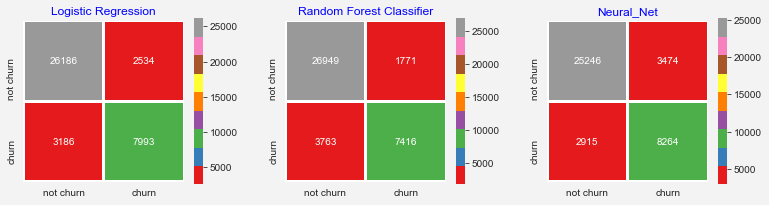

In [293]:
# Confusion Matrix
import itertools
lst    = [logit_clf, rf_clf, classifier]

length = len(lst)

mods   = ['Logistic Regression', 'Random Forest Classifier', "Neural_Net"]

fig = plt.figure(figsize=(13,15))
fig.set_facecolor("#F3F3F3")
for i,j,k in itertools.zip_longest(lst,range(length),mods):
    if j == None:
        break
    else:
        plt.subplot(4,3, j+1)
        predictions = i.predict(X_test)
        if k == "Neural_Net":
            conf_matrix = confusion_matrix(y_test, predictions >0.5)
        else:
            conf_matrix = confusion_matrix(y_test, predictions)
        sns.heatmap(conf_matrix,annot=True,fmt = "d",square = True,
                    xticklabels=["not churn","churn"],
                    yticklabels=["not churn","churn"],
                    linewidths = 2,linecolor = "w",cmap = "Set1")
        plt.title(k,color = "b")
        plt.subplots_adjust(wspace = .3,hspace = .3)

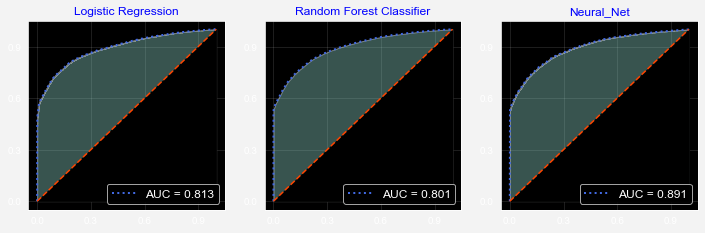

In [294]:
lst    = [logit_clf, rf_clf, classifier]

length = len(lst)

mods   = ['Logistic Regression', 'Random Forest Classifier', "Neural_Net"]

plt.style.use("dark_background")
fig = plt.figure(figsize=(12,16))
fig.set_facecolor("#F3F3F3")
for i,j,k in itertools.zip_longest(lst,range(length),mods) :
    qx = plt.subplot(4,3,j+1)
    probabilities = i.predict_proba(X_test)
    predictions   = i.predict(X_test)
    if k == "Neural_Net":
        fpr,tpr,thresholds = roc_curve(y_test,probabilities)
    else:
        fpr,tpr,thresholds = roc_curve(y_test,probabilities[:,1])
    plt.plot(fpr,tpr,linestyle = "dotted",
             color = "royalblue",linewidth = 2,
             label = "AUC = " + str(np.around(roc_auc_score(y_test,predictions),3)))
    plt.plot([0,1],[0,1],linestyle = "dashed",
             color = "orangered",linewidth = 1.5)
    plt.fill_between(fpr,tpr,alpha = .4)
    plt.fill_between([0,1],[0,1],color = "k")
    plt.legend(loc = "lower right",
               prop = {"size" : 12})
    qx.set_facecolor("k")
    plt.grid(True,alpha = .15)
    plt.title(k,color = "b")
    plt.xticks(np.arange(0,1,.3))
    plt.yticks(np.arange(0,1,.3))

### This models aimed to reduce the amount lost by the company to defaulters whilst still giving out loans to individuals most likely to pay back.

In [295]:
rate = (loans[loans.loanDefault==1]['loanAmount'].sum()/loans['loanAmount'].sum())*100
total = loans.loanAmount.sum()
print('My decisions were influenced by trying to reduce the rate of {}% which was the percentage of\n the total loan amounts disbursed to the defaulting clients in 2018 out of ₦{:,.2f}.'.format(rate.round(2), total))

My decisions were influenced by trying to reduce the rate of 27.13% which was the percentage of
 the total loan amounts disbursed to the defaulting clients in 2018 out of ₦5,637,598,500.00.
